# Image Compression using Principal Component Analysis 

Principal Component Analysis (PCA) is a dimensionality reduction technique. Its main goal is to transform high-dimensional data into a lower-dimensional space while preserving the maximum variance among the data points. PCA follows the following steps:
1. Center data $X$,
2. Compute the covariance matrix $C$ of the centered matrix $X$
$$ C = \frac{1}{m-1} \cdot X^\top \cdot X $$
3. Find the eigenvectors and eigenvalues of the covariance matrix $C$. Eigenvectors represent the directions of maximum variance, and eigenvalues represent the amount of variance along those directions.
4. Sort the eigenvectors by their corresponding eigenvalues in descending order. These eigenvectors form the basis for the principal components. You can choose a subset of these eigenvectors to retain a certain percentage of the total variance in the data.
5. To reduce the dimensionality of the data, project the centered data $X$ onto the new basis formed by the selected principal components. This can be done by multiplying $X$ by the matrix of selected eigenvectors.
6. If needed, you can also reconstruct the original data (approximately) by projecting the lower-dimensional data back onto the original feature space. This step is crucial if you want to interpret or visualize the data in its original form.

In this project, we are exploring the concept of image compression using PCA. 

## Imports

In [1]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from skimage import data, metrics

## Load image

Load the sample image...

In [2]:
camera_image = data.camera()

...and display it

In [3]:
plt.imshow(camera_image, cmap='gray')
plt.title('Camera Image')
plt.axis('off')
plt.savefig('camera_image')
%matplotlib inline

![Camera_image](camera_image.png)

## Principal Component Analysis

We want to apply PCA for three different n_components values. 

In [4]:
num_components_values = [20, 50, 100]

Display reconstructed images for different num_components values, along with their  Structural Similarity Index (SSI) to the original image. SSI quantifies the similarity between the original image and the reconstructed image.

In [15]:
plt.figure(figsize=(15, 15))

for idx, num_components in enumerate(num_components_values, 1):
    # Apply PCA
    pca = PCA(n_components=num_components) 
    image_pca = pca.fit_transform(camera_image) 

    # Reconstruct the image
    image_reconstructed = pca.inverse_transform(image_pca) 
    
    # Calculate Structural Similarity Index (SSI)
    ssi = metrics.structural_similarity(camera_image, image_reconstructed, data_range=image_reconstructed.max() - image_reconstructed.min())

    # Display the reconstructed image
    plt.subplot(3, 3, idx)
    plt.imshow(image_reconstructed, cmap='gray')
    plt.title(f'Reconstructed (n={num_components}), SSI: {ssi:.4f}')
    plt.axis('off')

plt.tight_layout()
plt.savefig('PCA_reconstructed')
%matplotlib inline

![PCA_reconstructed](PCA_reconstructed.png)

### Explained Variance

Display the cumulative explained variance captured by each principal component. It shows the cumulative sum of the explained variance ratios as the number of principal components increases. This plot helps us understand how well the compression retains the original image's information. A steeper slope indicates that a few principal components capture most of the image's information.

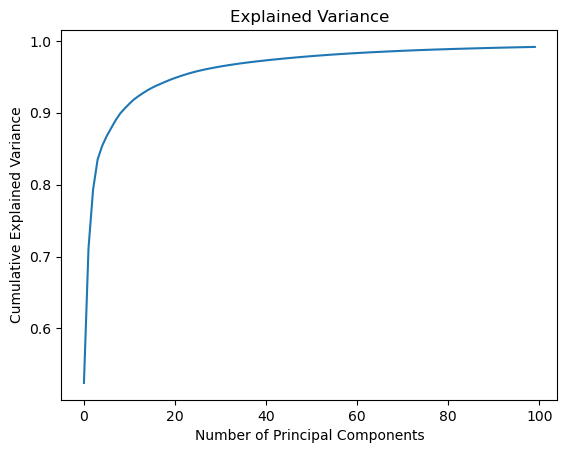

In [10]:
pca = PCA(n_components=max(num_components_values))
image_pca = pca.fit_transform(camera_image)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance')
plt.show()

### PCA Heatmap

PCA heatmap that visually represents the significance of each pixel in contributing to the variance captured by the principal components.

Get the principal components and their weights

In [11]:
principal_components = pca.components_
explained_variances = pca.explained_variance_ratio_

Plot PCA Heatmap

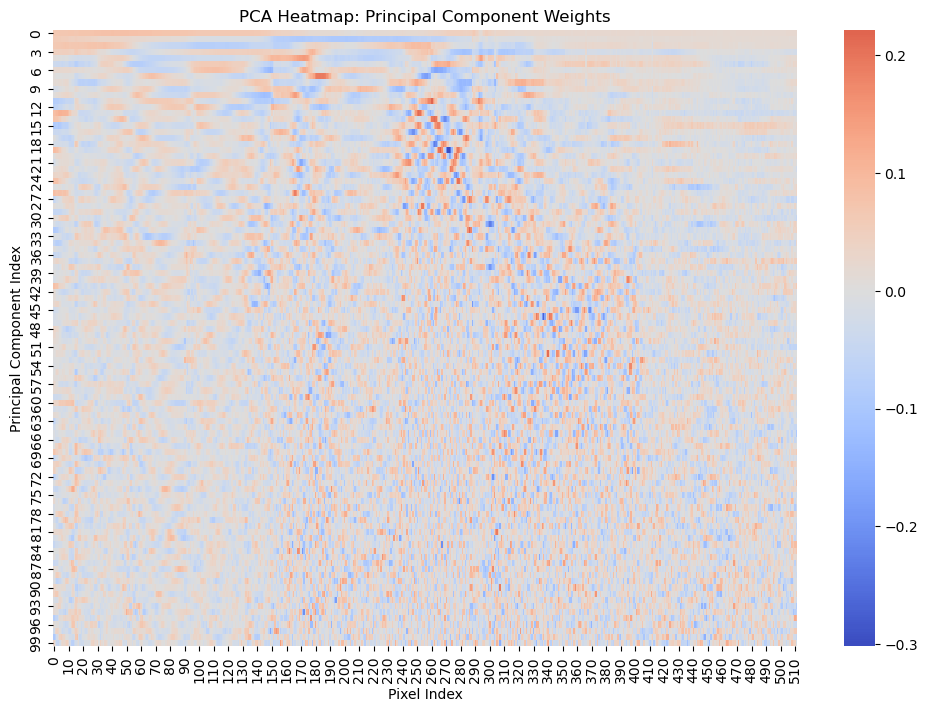

In [12]:
plt.figure(figsize=(12, 8))
sns.heatmap(principal_components, cmap='coolwarm', center=0)
plt.xlabel('Pixel Index')
plt.ylabel('Principal Component Index')
plt.title('PCA Heatmap: Principal Component Weights')
plt.show()